## 7.基于K-Means和GMM聚类算法的共享单车使用情况分析

In [1]:
import pandas as pd

data = pd.read_csv ('data\data_bike.csv',encoding='gbk',index_col='日期与时间',parse_dates=True)
data

,桥西边,桥东边
日期与时间,,
2012-10-03 00:00:00,4.0,9.0
2012-10-03 01:00:00,4.0,6.0
2012-10-03 02:00:00,1.0,1.0
2012-10-03 03:00:00,2.0,3.0
2012-10-03 04:00:00,6.0,1.0
...,...,...
2017-07-31 19:00:00,88.0,182.0
2017-07-31 20:00:00,56.0,98.0
2017-07-31 21:00:00,53.0,53.0


In [2]:
data ['总数'] =data['桥西边']+data['桥东边']
data

,桥西边,桥东边,总数
日期与时间,,,
2012-10-03 00:00:00,4.0,9.0,13.0
2012-10-03 01:00:00,4.0,6.0,10.0
2012-10-03 02:00:00,1.0,1.0,2.0
2012-10-03 03:00:00,2.0,3.0,5.0
2012-10-03 04:00:00,6.0,1.0,7.0
...,...,...,...
2017-07-31 19:00:00,88.0,182.0,270.0
2017-07-31 20:00:00,56.0,98.0,154.0
2017-07-31 21:00:00,53.0,53.0,106.0


In [3]:
pivoted = data.pivot_table('总数', index=data.index.time, columns=data.index.date) 
pivoted

,2012-10-03,2012-10-04,2012-10-05,2012-10-06,2012-10-07,2012-10-08,2012-10-09,2012-10-10,2012-10-11,2012-10-12,...,2017-07-22,2017-07-23,2017-07-24,2017-07-25,2017-07-26,2017-07-27,2017-07-28,2017-07-29,2017-07-30,2017-07-31
00:00:00,13.0,18.0,11.0,15.0,11.0,9.0,12.0,15.0,21.0,17.0,...,34.0,33.0,13.0,11.0,17.0,14.0,15.0,30.0,33.0,5.0
01:00:00,10.0,3.0,8.0,15.0,17.0,4.0,3.0,3.0,10.0,13.0,...,17.0,14.0,7.0,9.0,5.0,14.0,8.0,18.0,22.0,7.0
02:00:00,2.0,9.0,7.0,9.0,3.0,5.0,4.0,3.0,13.0,5.0,...,4.0,4.0,5.0,2.0,4.0,6.0,2.0,12.0,8.0,1.0
03:00:00,5.0,3.0,4.0,3.0,6.0,5.0,8.0,4.0,2.0,7.0,...,13.0,2.0,6.0,5.0,1.0,4.0,2.0,4.0,4.0,2.0
04:00:00,7.0,8.0,9.0,5.0,3.0,5.0,9.0,5.0,12.0,5.0,...,4.0,5.0,11.0,12.0,14.0,17.0,11.0,5.0,7.0,11.0
05:00:00,31.0,26.0,25.0,5.0,9.0,23.0,31.0,25.0,12.0,14.0,...,13.0,11.0,48.0,52.0,46.0,59.0,45.0,12.0,13.0,52.0
06:00:00,155.0,142.0,105.0,27.0,17.0,137.0,153.0,149.0,43.0,87.0,...,30.0,25.0,193.0,196.0,205.0,175.0,150.0,33.0,28.0,166.0
07:00:00,352.0,319.0,319.0,33.0,26.0,327.0,368.0,340.0,304.0,183.0,...,61.0,51.0,462.0,534.0,507.0,335.0,353.0,65.0,37.0,492.0
08:00:00,437.0,418.0,370.0,105.0,69.0,457.0,462.0,435.0,404.0,268.0,...,104.0,76.0,667.0,707.0,650.0,499.0,533.0,88.0,76.0,660.0
09:00:00,276.0,241.0,212.0,114.0,103.0,278.0,275.0,255.0,189.0,145.0,...,125.0,95.0,348.0,343.0,348.0,256.0,297.0,134.0,93.0,364.0


In [4]:
total = pivoted.isnull().sum().sort_values(ascending=False)
missing_data = pd.DataFrame({"缺失值数量":total})
missing_data.head(10)

,缺失值数量
2013-06-14,2
2015-04-21,2
2017-03-12,1
2016-03-13,1
2015-03-08,1
2014-03-09,1
2014-05-15,0
2014-05-06,0
2014-05-07,0
2014-05-08,0


In [5]:
Complete_data=pivoted.fillna(0)

total = Complete_data.isnull().sum().sort_values(ascending=False)
missing_data = pd.DataFrame({"缺失值数量":total})
missing_data.head(10)

,缺失值数量
2017-07-31,0
2014-05-17,0
2014-05-06,0
2014-05-07,0
2014-05-08,0
2014-05-09,0
2014-05-10,0
2014-05-11,0
2014-05-12,0
2014-05-13,0


In [6]:
X = Complete_data.T
X

,00:00:00,01:00:00,02:00:00,03:00:00,04:00:00,05:00:00,06:00:00,07:00:00,08:00:00,09:00:00,...,14:00:00,15:00:00,16:00:00,17:00:00,18:00:00,19:00:00,20:00:00,21:00:00,22:00:00,23:00:00
2012-10-03,13.0,10.0,2.0,5.0,7.0,31.0,155.0,352.0,437.0,276.0,...,128.0,164.0,315.0,583.0,380.0,128.0,80.0,63.0,49.0,17.0
2012-10-04,18.0,3.0,9.0,3.0,8.0,26.0,142.0,319.0,418.0,241.0,...,119.0,147.0,275.0,507.0,378.0,164.0,83.0,70.0,46.0,41.0
2012-10-05,11.0,8.0,7.0,4.0,9.0,25.0,105.0,319.0,370.0,212.0,...,125.0,164.0,310.0,434.0,316.0,115.0,68.0,42.0,36.0,32.0
2012-10-06,15.0,15.0,9.0,3.0,5.0,5.0,27.0,33.0,105.0,114.0,...,203.0,211.0,183.0,180.0,96.0,78.0,43.0,33.0,34.0,34.0
2012-10-07,11.0,17.0,3.0,6.0,3.0,9.0,17.0,26.0,69.0,103.0,...,241.0,231.0,225.0,191.0,113.0,49.0,55.0,47.0,18.0,16.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-07-27,14.0,14.0,6.0,4.0,17.0,59.0,175.0,335.0,499.0,256.0,...,112.0,163.0,325.0,613.0,417.0,252.0,169.0,105.0,48.0,29.0
2017-07-28,15.0,8.0,2.0,2.0,11.0,45.0,150.0,353.0,533.0,297.0,...,173.0,232.0,385.0,652.0,398.0,209.0,128.0,106.0,67.0,45.0
2017-07-29,30.0,18.0,12.0,4.0,5.0,12.0,33.0,65.0,88.0,134.0,...,208.0,199.0,181.0,161.0,158.0,99.0,90.0,69.0,49.0,40.0
2017-07-30,33.0,22.0,8.0,4.0,7.0,13.0,28.0,37.0,76.0,93.0,...,199.0,177.0,179.0,203.0,152.0,116.0,96.0,52.0,34.0,24.0


In [7]:
import matplotlib.pyplot as plt
%matplotlib inline

from matplotlib.font_manager import FontProperties

In [8]:
x_ticks_labels = ['{}:00'.format(i) for i in range(24)]
x_ticks_labels

['0:00',
 '1:00',
 '2:00',
 '3:00',
 '4:00',
 '5:00',
 '6:00',
 '7:00',
 '8:00',
 '9:00',
 '10:00',
 '11:00',
 '12:00',
 '13:00',
 '14:00',
 '15:00',
 '16:00',
 '17:00',
 '18:00',
 '19:00',
 '20:00',
 '21:00',
 '22:00',
 '23:00']

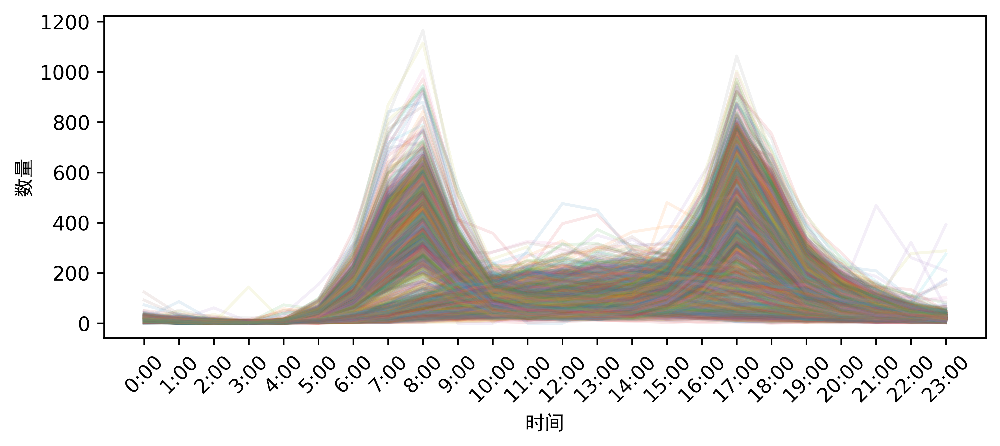

In [9]:
myfont=FontProperties(fname=r'C:\Windows\Fonts\simhei.ttf')

plt.figure(figsize=(8, 3),dpi=600)

plt.plot(Complete_data.values,alpha =0.1)
plt.xticks(range(24), x_ticks_labels,rotation=45)
plt.xlabel("时间",fontproperties=myfont)
plt.ylabel("数量",fontproperties=myfont)
plt.show()

In [10]:
from  sklearn.decomposition import PCA 

pca=PCA(n_components=0.95)
X2 = pca.fit_transform(X)

In [11]:
print(pca.explained_variance_ratio_)

[0.88072218 0.0748808 ]


In [12]:
print('降维后的数据如下:\n',X2)
print(X2.shape)

降维后的数据如下:
 [[ 322.83748285  -11.06276487]
 [ 247.04503854   33.0698699 ]
 [ 145.43847426   40.51452192]
 ...
 [-346.2990187   280.31144318]
 [-353.9068938   233.77444603]
 [ 762.42241386   30.89610639]]
(1763, 2)


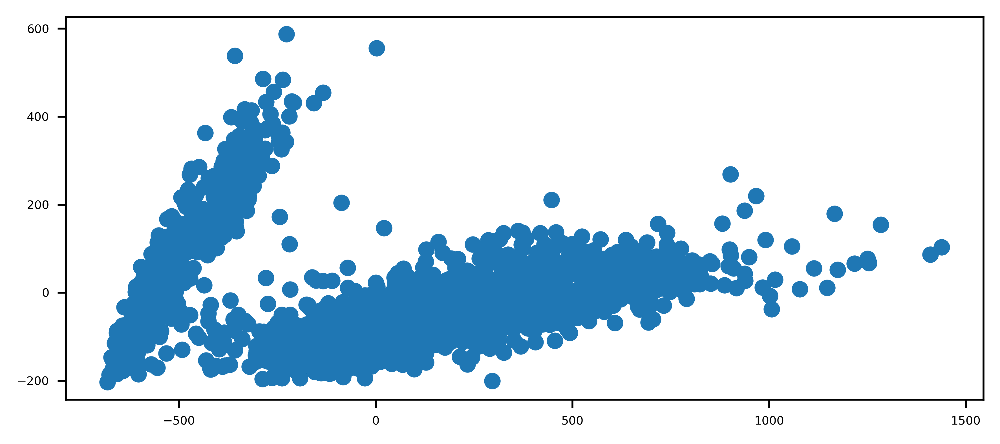

In [13]:
plt.figure(figsize=(7,3),dpi=600)
plt.xticks(fontsize=5)
plt.yticks(fontsize=5)
plt.scatter(X2[:,0],X2[:,1])

In [14]:
X_kmeans=X.copy()

In [15]:
X_gmm=X.copy() 

In [16]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=2)
kmeans.fit(X_kmeans)
y_kmeans = kmeans.predict(X_kmeans)
y_kmeans 

array([1, 1, 1, ..., 0, 0, 1])

In [17]:
X_kmeans.insert(0,'标签',y_kmeans )
X_kmeans

,标签,00:00:00,01:00:00,02:00:00,03:00:00,04:00:00,05:00:00,06:00:00,07:00:00,08:00:00,...,14:00:00,15:00:00,16:00:00,17:00:00,18:00:00,19:00:00,20:00:00,21:00:00,22:00:00,23:00:00
2012-10-03,1,13.0,10.0,2.0,5.0,7.0,31.0,155.0,352.0,437.0,...,128.0,164.0,315.0,583.0,380.0,128.0,80.0,63.0,49.0,17.0
2012-10-04,1,18.0,3.0,9.0,3.0,8.0,26.0,142.0,319.0,418.0,...,119.0,147.0,275.0,507.0,378.0,164.0,83.0,70.0,46.0,41.0
2012-10-05,1,11.0,8.0,7.0,4.0,9.0,25.0,105.0,319.0,370.0,...,125.0,164.0,310.0,434.0,316.0,115.0,68.0,42.0,36.0,32.0
2012-10-06,0,15.0,15.0,9.0,3.0,5.0,5.0,27.0,33.0,105.0,...,203.0,211.0,183.0,180.0,96.0,78.0,43.0,33.0,34.0,34.0
2012-10-07,0,11.0,17.0,3.0,6.0,3.0,9.0,17.0,26.0,69.0,...,241.0,231.0,225.0,191.0,113.0,49.0,55.0,47.0,18.0,16.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-07-27,1,14.0,14.0,6.0,4.0,17.0,59.0,175.0,335.0,499.0,...,112.0,163.0,325.0,613.0,417.0,252.0,169.0,105.0,48.0,29.0
2017-07-28,1,15.0,8.0,2.0,2.0,11.0,45.0,150.0,353.0,533.0,...,173.0,232.0,385.0,652.0,398.0,209.0,128.0,106.0,67.0,45.0
2017-07-29,0,30.0,18.0,12.0,4.0,5.0,12.0,33.0,65.0,88.0,...,208.0,199.0,181.0,161.0,158.0,99.0,90.0,69.0,49.0,40.0
2017-07-30,0,33.0,22.0,8.0,4.0,7.0,13.0,28.0,37.0,76.0,...,199.0,177.0,179.0,203.0,152.0,116.0,96.0,52.0,34.0,24.0


In [18]:
X_kmeans['标签']== 0

2012-10-03    False
2012-10-04    False
2012-10-05    False
2012-10-06     True
2012-10-07     True
              ...  
2017-07-27    False
2017-07-28    False
2017-07-29     True
2017-07-30     True
2017-07-31    False
Name: 标签, Length: 1763, dtype: bool

In [19]:
X_kmeans_label0=X_kmeans[X_kmeans['标签']== 0]
X_kmeans_label0

,标签,00:00:00,01:00:00,02:00:00,03:00:00,04:00:00,05:00:00,06:00:00,07:00:00,08:00:00,...,14:00:00,15:00:00,16:00:00,17:00:00,18:00:00,19:00:00,20:00:00,21:00:00,22:00:00,23:00:00
2012-10-06,0,15.0,15.0,9.0,3.0,5.0,5.0,27.0,33.0,105.0,...,203.0,211.0,183.0,180.0,96.0,78.0,43.0,33.0,34.0,34.0
2012-10-07,0,11.0,17.0,3.0,6.0,3.0,9.0,17.0,26.0,69.0,...,241.0,231.0,225.0,191.0,113.0,49.0,55.0,47.0,18.0,16.0
2012-10-12,0,17.0,13.0,5.0,7.0,5.0,14.0,87.0,183.0,268.0,...,65.0,113.0,165.0,304.0,178.0,79.0,38.0,26.0,14.0,24.0
2012-10-13,0,18.0,11.0,16.0,4.0,3.0,10.0,14.0,30.0,32.0,...,62.0,41.0,58.0,50.0,59.0,27.0,19.0,10.0,18.0,19.0
2012-10-14,0,6.0,9.0,8.0,4.0,5.0,3.0,12.0,14.0,24.0,...,58.0,37.0,34.0,37.0,27.0,23.0,11.0,12.0,13.0,10.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-07-16,0,26.0,10.0,5.0,2.0,8.0,12.0,23.0,40.0,82.0,...,227.0,190.0,163.0,148.0,159.0,112.0,68.0,35.0,31.0,16.0
2017-07-22,0,34.0,17.0,4.0,13.0,4.0,13.0,30.0,61.0,104.0,...,229.0,197.0,194.0,159.0,139.0,94.0,75.0,58.0,29.0,30.0
2017-07-23,0,33.0,14.0,4.0,2.0,5.0,11.0,25.0,51.0,76.0,...,187.0,226.0,168.0,157.0,122.0,111.0,76.0,51.0,36.0,23.0
2017-07-29,0,30.0,18.0,12.0,4.0,5.0,12.0,33.0,65.0,88.0,...,208.0,199.0,181.0,161.0,158.0,99.0,90.0,69.0,49.0,40.0


In [20]:
X_kmeans_label1=X_kmeans[X_kmeans['标签']== 1]
X_kmeans_label1

,标签,00:00:00,01:00:00,02:00:00,03:00:00,04:00:00,05:00:00,06:00:00,07:00:00,08:00:00,...,14:00:00,15:00:00,16:00:00,17:00:00,18:00:00,19:00:00,20:00:00,21:00:00,22:00:00,23:00:00
2012-10-03,1,13.0,10.0,2.0,5.0,7.0,31.0,155.0,352.0,437.0,...,128.0,164.0,315.0,583.0,380.0,128.0,80.0,63.0,49.0,17.0
2012-10-04,1,18.0,3.0,9.0,3.0,8.0,26.0,142.0,319.0,418.0,...,119.0,147.0,275.0,507.0,378.0,164.0,83.0,70.0,46.0,41.0
2012-10-05,1,11.0,8.0,7.0,4.0,9.0,25.0,105.0,319.0,370.0,...,125.0,164.0,310.0,434.0,316.0,115.0,68.0,42.0,36.0,32.0
2012-10-08,1,9.0,4.0,5.0,5.0,5.0,23.0,137.0,327.0,457.0,...,121.0,167.0,252.0,604.0,365.0,168.0,94.0,63.0,29.0,24.0
2012-10-09,1,12.0,3.0,4.0,8.0,9.0,31.0,153.0,368.0,462.0,...,108.0,134.0,244.0,597.0,396.0,163.0,85.0,64.0,34.0,23.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-07-25,1,11.0,9.0,2.0,5.0,12.0,52.0,196.0,534.0,707.0,...,150.0,170.0,404.0,798.0,529.0,333.0,185.0,110.0,61.0,31.0
2017-07-26,1,17.0,5.0,4.0,1.0,14.0,46.0,205.0,507.0,650.0,...,134.0,194.0,402.0,788.0,551.0,297.0,205.0,115.0,85.0,34.0
2017-07-27,1,14.0,14.0,6.0,4.0,17.0,59.0,175.0,335.0,499.0,...,112.0,163.0,325.0,613.0,417.0,252.0,169.0,105.0,48.0,29.0
2017-07-28,1,15.0,8.0,2.0,2.0,11.0,45.0,150.0,353.0,533.0,...,173.0,232.0,385.0,652.0,398.0,209.0,128.0,106.0,67.0,45.0


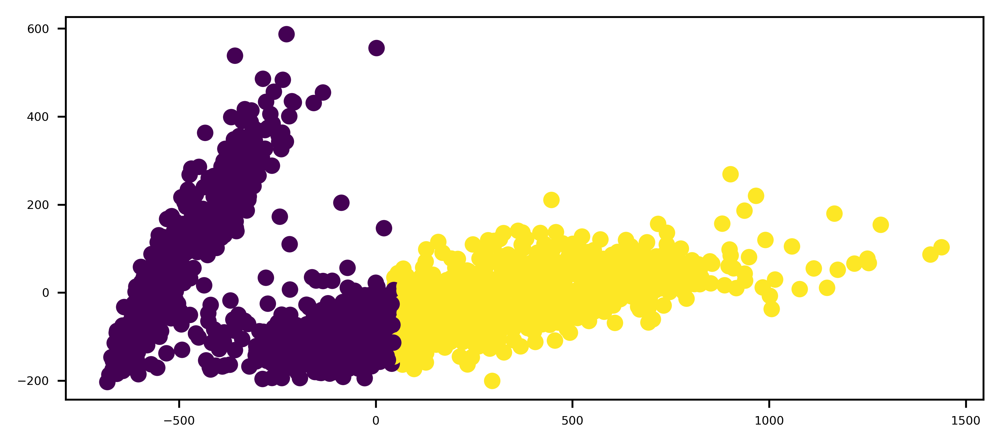

In [21]:
plt.figure(figsize=(7,3),dpi=600)
plt.xticks(fontsize=5)
plt.yticks(fontsize=5)
plt.scatter(X2[:, 0], X2[:, 1], c=y_kmeans)

In [22]:
X_kmeans_label0=X_kmeans_label0.drop('标签',axis=1)
X_kmeans_label1=X_kmeans_label1.drop('标签',axis=1)

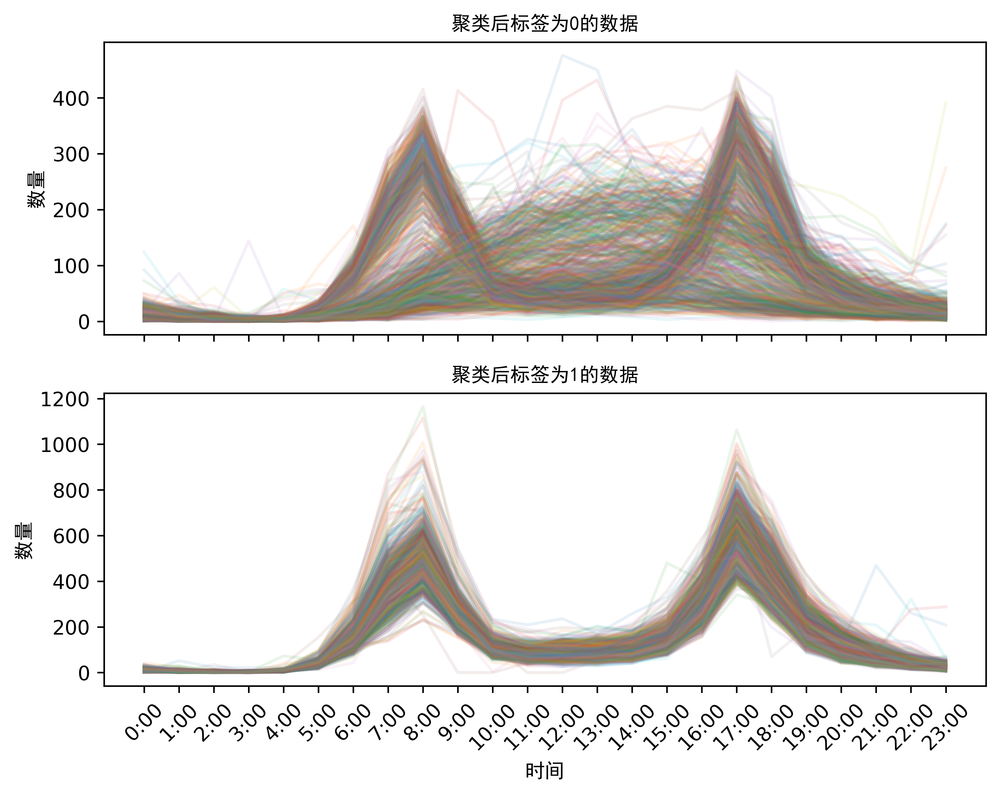

In [23]:
myfont=FontProperties(fname=r'C:\Windows\Fonts\simhei.ttf')

fig,axes = plt.subplots(2, 1,sharex=True,figsize=(8,6),dpi=600)

axes[0].plot(X_kmeans_label0.T.values,alpha =0.1)
axes[1].plot(X_kmeans_label1.T.values,alpha =0.1)

axes[1].set_xticks(range(24))
axes[1].set_xticklabels(x_ticks_labels,rotation=45)
axes[1].set_xlabel('时间',fontproperties=myfont) 

axes[0].set_ylabel('数量',fontproperties=myfont)
axes[1].set_ylabel('数量',fontproperties=myfont)

axes[0].set_title ('聚类后标签为0的数据',fontproperties=myfont)
axes[1].set_title ('聚类后标签为1的数据',fontproperties=myfont)

plt.show()

In [24]:
kmeans_label0_time=pd.to_datetime(X_kmeans_label0.index) 
kmeans_label0_time 

DatetimeIndex(['2012-10-06', '2012-10-07', '2012-10-12', '2012-10-13',
               '2012-10-14', '2012-10-15', '2012-10-19', '2012-10-20',
               '2012-10-21', '2012-10-22',
               ...
               '2017-07-03', '2017-07-04', '2017-07-08', '2017-07-09',
               '2017-07-15', '2017-07-16', '2017-07-22', '2017-07-23',
               '2017-07-29', '2017-07-30'],
              dtype='datetime64[ns]', length=993, freq=None)

In [25]:
kmeans_week_label0=kmeans_label0_time.strftime('%A')
kmeans_week_label0 

Index(['Saturday', 'Sunday', 'Friday', 'Saturday', 'Sunday', 'Monday',
       'Friday', 'Saturday', 'Sunday', 'Monday',
       ...
       'Monday', 'Tuesday', 'Saturday', 'Sunday', 'Saturday', 'Sunday',
       'Saturday', 'Sunday', 'Saturday', 'Sunday'],
      dtype='object', length=993)

In [26]:
kmeans_week_label0_list=kmeans_week_label0.tolist()
kmeans_week_label0_list[0:10]

['Saturday',
 'Sunday',
 'Friday',
 'Saturday',
 'Sunday',
 'Monday',
 'Friday',
 'Saturday',
 'Sunday',
 'Monday']

In [27]:
print('星期一有%3d天'%(kmeans_week_label0_list.count('Monday')));
print('星期二有%3d天'%(kmeans_week_label0_list.count('Tuesday')));
print('星期三有%3d天'%(kmeans_week_label0_list.count('Wednesday')));
print('星期四有%3d天'%(kmeans_week_label0_list.count('Thursday')));
print('星期五有%3d天'%(kmeans_week_label0_list.count('Friday')));
print('星期六有%3d天'%(kmeans_week_label0_list.count('Saturday')));
print('星期天有%3d天'%(kmeans_week_label0_list.count('Sunday')))

星期一有 91天
星期二有 84天
星期三有 87天
星期四有100天
星期五有127天
星期六有252天
星期天有252天


In [28]:
kmeans_label1_time=pd.to_datetime(X_kmeans_label1.index) 
kmeans_label1_time

DatetimeIndex(['2012-10-03', '2012-10-04', '2012-10-05', '2012-10-08',
               '2012-10-09', '2012-10-10', '2012-10-11', '2012-10-16',
               '2012-10-17', '2012-10-18',
               ...
               '2017-07-18', '2017-07-19', '2017-07-20', '2017-07-21',
               '2017-07-24', '2017-07-25', '2017-07-26', '2017-07-27',
               '2017-07-28', '2017-07-31'],
              dtype='datetime64[ns]', length=770, freq=None)

In [29]:
kmeans_week_label1=kmeans_label1_time.strftime('%A')
kmeans_week_label1 

Index(['Wednesday', 'Thursday', 'Friday', 'Monday', 'Tuesday', 'Wednesday',
       'Thursday', 'Tuesday', 'Wednesday', 'Thursday',
       ...
       'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Monday', 'Tuesday',
       'Wednesday', 'Thursday', 'Friday', 'Monday'],
      dtype='object', length=770)

In [30]:
kmeans_week_label1_list=kmeans_week_label1.tolist()
kmeans_week_label1_list[0:10] 

['Wednesday',
 'Thursday',
 'Friday',
 'Monday',
 'Tuesday',
 'Wednesday',
 'Thursday',
 'Tuesday',
 'Wednesday',
 'Thursday']

In [31]:
print('星期一有%3d天'%(kmeans_week_label1_list.count('Monday')));
print('星期二有%3d天'%(kmeans_week_label1_list.count('Tuesday')));
print('星期三有%3d天'%(kmeans_week_label1_list.count('Wednesday')));
print('星期四有%3d天'%(kmeans_week_label1_list.count('Thursday')));
print('星期五有%3d天'%(kmeans_week_label1_list.count('Friday')));
print('星期六有%3d天'%(kmeans_week_label1_list.count('Saturday')));
print('星期天有%3d天'%(kmeans_week_label1_list.count('Sunday')))

星期一有161天
星期二有167天
星期三有165天
星期四有152天
星期五有125天
星期六有  0天
星期天有  0天


In [32]:
from sklearn.mixture import GaussianMixture 

gmm =GaussianMixture(n_components=2)
gmm.fit(X_gmm)
y_gmm = gmm.predict(X_gmm) 
y_gmm                      

array([1, 1, 1, ..., 0, 0, 1], dtype=int64)

In [33]:
X_gmm.insert(0,'标签',y_gmm )
X_gmm

,标签,00:00:00,01:00:00,02:00:00,03:00:00,04:00:00,05:00:00,06:00:00,07:00:00,08:00:00,...,14:00:00,15:00:00,16:00:00,17:00:00,18:00:00,19:00:00,20:00:00,21:00:00,22:00:00,23:00:00
2012-10-03,1,13.0,10.0,2.0,5.0,7.0,31.0,155.0,352.0,437.0,...,128.0,164.0,315.0,583.0,380.0,128.0,80.0,63.0,49.0,17.0
2012-10-04,1,18.0,3.0,9.0,3.0,8.0,26.0,142.0,319.0,418.0,...,119.0,147.0,275.0,507.0,378.0,164.0,83.0,70.0,46.0,41.0
2012-10-05,1,11.0,8.0,7.0,4.0,9.0,25.0,105.0,319.0,370.0,...,125.0,164.0,310.0,434.0,316.0,115.0,68.0,42.0,36.0,32.0
2012-10-06,0,15.0,15.0,9.0,3.0,5.0,5.0,27.0,33.0,105.0,...,203.0,211.0,183.0,180.0,96.0,78.0,43.0,33.0,34.0,34.0
2012-10-07,0,11.0,17.0,3.0,6.0,3.0,9.0,17.0,26.0,69.0,...,241.0,231.0,225.0,191.0,113.0,49.0,55.0,47.0,18.0,16.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-07-27,1,14.0,14.0,6.0,4.0,17.0,59.0,175.0,335.0,499.0,...,112.0,163.0,325.0,613.0,417.0,252.0,169.0,105.0,48.0,29.0
2017-07-28,1,15.0,8.0,2.0,2.0,11.0,45.0,150.0,353.0,533.0,...,173.0,232.0,385.0,652.0,398.0,209.0,128.0,106.0,67.0,45.0
2017-07-29,0,30.0,18.0,12.0,4.0,5.0,12.0,33.0,65.0,88.0,...,208.0,199.0,181.0,161.0,158.0,99.0,90.0,69.0,49.0,40.0
2017-07-30,0,33.0,22.0,8.0,4.0,7.0,13.0,28.0,37.0,76.0,...,199.0,177.0,179.0,203.0,152.0,116.0,96.0,52.0,34.0,24.0


In [34]:
X_gmm['标签']== 0

2012-10-03    False
2012-10-04    False
2012-10-05    False
2012-10-06     True
2012-10-07     True
              ...  
2017-07-27    False
2017-07-28    False
2017-07-29     True
2017-07-30     True
2017-07-31    False
Name: 标签, Length: 1763, dtype: bool

In [35]:
X_gmm_label0=X_gmm[X_gmm['标签']== 0]
X_gmm_label0

,标签,00:00:00,01:00:00,02:00:00,03:00:00,04:00:00,05:00:00,06:00:00,07:00:00,08:00:00,...,14:00:00,15:00:00,16:00:00,17:00:00,18:00:00,19:00:00,20:00:00,21:00:00,22:00:00,23:00:00
2012-10-06,0,15.0,15.0,9.0,3.0,5.0,5.0,27.0,33.0,105.0,...,203.0,211.0,183.0,180.0,96.0,78.0,43.0,33.0,34.0,34.0
2012-10-07,0,11.0,17.0,3.0,6.0,3.0,9.0,17.0,26.0,69.0,...,241.0,231.0,225.0,191.0,113.0,49.0,55.0,47.0,18.0,16.0
2012-10-13,0,18.0,11.0,16.0,4.0,3.0,10.0,14.0,30.0,32.0,...,62.0,41.0,58.0,50.0,59.0,27.0,19.0,10.0,18.0,19.0
2012-10-14,0,6.0,9.0,8.0,4.0,5.0,3.0,12.0,14.0,24.0,...,58.0,37.0,34.0,37.0,27.0,23.0,11.0,12.0,13.0,10.0
2012-10-20,0,9.0,8.0,12.0,5.0,3.0,15.0,16.0,28.0,46.0,...,98.0,72.0,76.0,63.0,69.0,36.0,22.0,13.0,12.0,20.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-07-16,0,26.0,10.0,5.0,2.0,8.0,12.0,23.0,40.0,82.0,...,227.0,190.0,163.0,148.0,159.0,112.0,68.0,35.0,31.0,16.0
2017-07-22,0,34.0,17.0,4.0,13.0,4.0,13.0,30.0,61.0,104.0,...,229.0,197.0,194.0,159.0,139.0,94.0,75.0,58.0,29.0,30.0
2017-07-23,0,33.0,14.0,4.0,2.0,5.0,11.0,25.0,51.0,76.0,...,187.0,226.0,168.0,157.0,122.0,111.0,76.0,51.0,36.0,23.0
2017-07-29,0,30.0,18.0,12.0,4.0,5.0,12.0,33.0,65.0,88.0,...,208.0,199.0,181.0,161.0,158.0,99.0,90.0,69.0,49.0,40.0


In [36]:
X_gmm_label1=X_gmm[X_gmm['标签']== 1]
X_gmm_label1

,标签,00:00:00,01:00:00,02:00:00,03:00:00,04:00:00,05:00:00,06:00:00,07:00:00,08:00:00,...,14:00:00,15:00:00,16:00:00,17:00:00,18:00:00,19:00:00,20:00:00,21:00:00,22:00:00,23:00:00
2012-10-03,1,13.0,10.0,2.0,5.0,7.0,31.0,155.0,352.0,437.0,...,128.0,164.0,315.0,583.0,380.0,128.0,80.0,63.0,49.0,17.0
2012-10-04,1,18.0,3.0,9.0,3.0,8.0,26.0,142.0,319.0,418.0,...,119.0,147.0,275.0,507.0,378.0,164.0,83.0,70.0,46.0,41.0
2012-10-05,1,11.0,8.0,7.0,4.0,9.0,25.0,105.0,319.0,370.0,...,125.0,164.0,310.0,434.0,316.0,115.0,68.0,42.0,36.0,32.0
2012-10-08,1,9.0,4.0,5.0,5.0,5.0,23.0,137.0,327.0,457.0,...,121.0,167.0,252.0,604.0,365.0,168.0,94.0,63.0,29.0,24.0
2012-10-09,1,12.0,3.0,4.0,8.0,9.0,31.0,153.0,368.0,462.0,...,108.0,134.0,244.0,597.0,396.0,163.0,85.0,64.0,34.0,23.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-07-25,1,11.0,9.0,2.0,5.0,12.0,52.0,196.0,534.0,707.0,...,150.0,170.0,404.0,798.0,529.0,333.0,185.0,110.0,61.0,31.0
2017-07-26,1,17.0,5.0,4.0,1.0,14.0,46.0,205.0,507.0,650.0,...,134.0,194.0,402.0,788.0,551.0,297.0,205.0,115.0,85.0,34.0
2017-07-27,1,14.0,14.0,6.0,4.0,17.0,59.0,175.0,335.0,499.0,...,112.0,163.0,325.0,613.0,417.0,252.0,169.0,105.0,48.0,29.0
2017-07-28,1,15.0,8.0,2.0,2.0,11.0,45.0,150.0,353.0,533.0,...,173.0,232.0,385.0,652.0,398.0,209.0,128.0,106.0,67.0,45.0


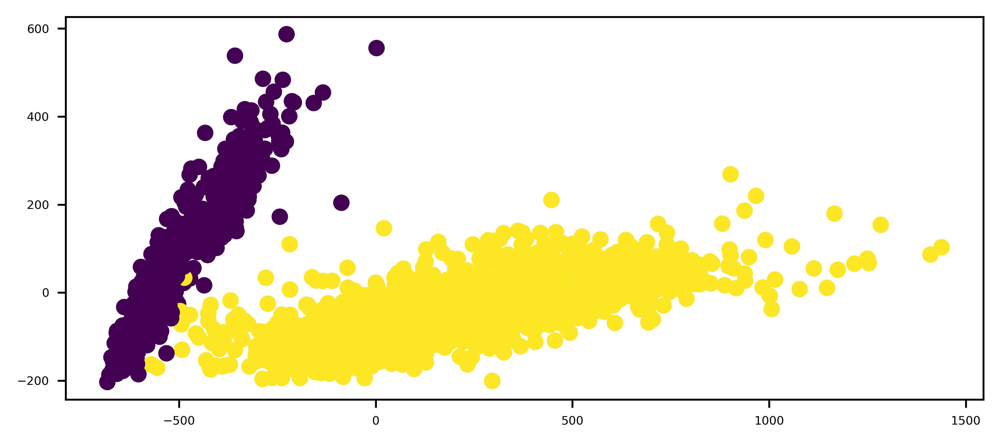

In [37]:
plt.figure(figsize=(7,3),dpi=600)
plt.xticks(fontsize=5)
plt.yticks(fontsize=5)
plt.scatter(X2[:, 0], X2[:, 1], c=y_gmm)

In [38]:
X_gmm_label0=X_gmm_label0.drop('标签',axis=1)
X_gmm_label1=X_gmm_label1.drop('标签',axis=1)

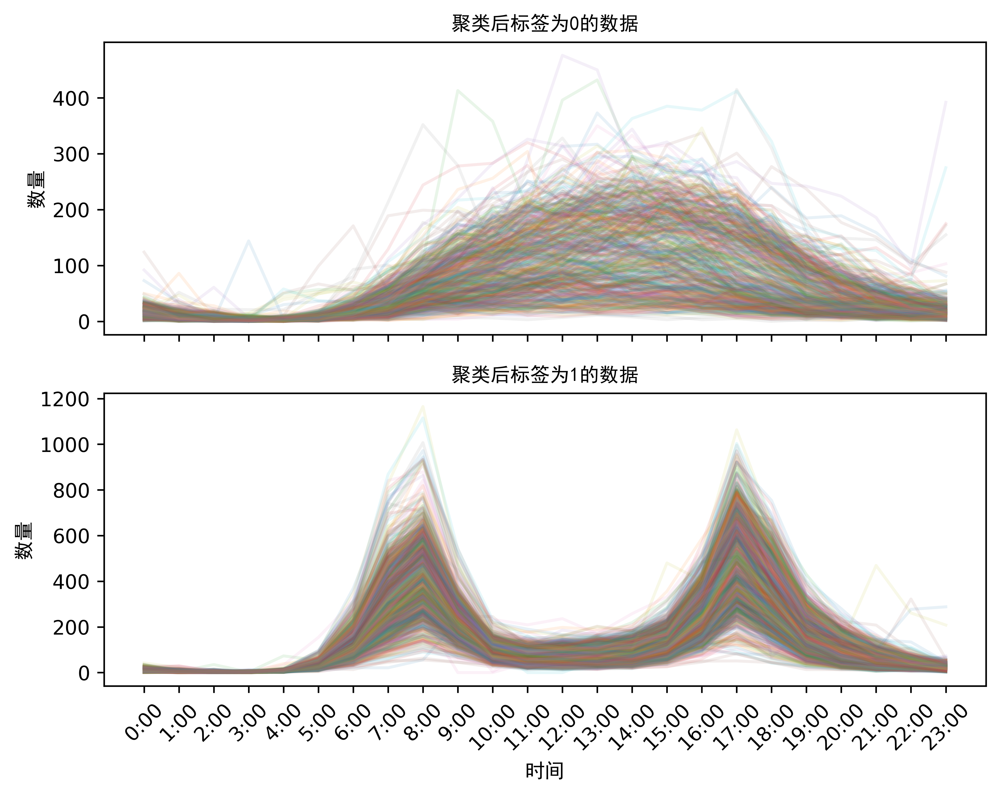

In [39]:
myfont=FontProperties(fname=r'C:\Windows\Fonts\simhei.ttf')

fig,axes = plt.subplots(2, 1,sharex=True,figsize=(8,6),dpi=600)

axes[0].plot(X_gmm_label0.T.values,alpha =0.1)
axes[1].plot(X_gmm_label1.T.values,alpha =0.1)

axes[1].set_xticks(range(24))
axes[1].set_xticklabels(x_ticks_labels,rotation=45)
axes[1].set_xlabel('时间',fontproperties=myfont) 

axes[0].set_ylabel('数量',fontproperties=myfont)
axes[1].set_ylabel('数量',fontproperties=myfont)

axes[0].set_title ('聚类后标签为0的数据',fontproperties=myfont)
axes[1].set_title ('聚类后标签为1的数据',fontproperties=myfont)

plt.show()

In [40]:
gmm_label0_time=pd.to_datetime(X_gmm_label0.index) 
gmm_label0_time 

DatetimeIndex(['2012-10-06', '2012-10-07', '2012-10-13', '2012-10-14',
               '2012-10-20', '2012-10-21', '2012-10-27', '2012-10-28',
               '2012-11-03', '2012-11-04',
               ...
               '2017-07-02', '2017-07-04', '2017-07-08', '2017-07-09',
               '2017-07-15', '2017-07-16', '2017-07-22', '2017-07-23',
               '2017-07-29', '2017-07-30'],
              dtype='datetime64[ns]', length=546, freq=None)

In [41]:
gmm_week_label0=gmm_label0_time.strftime('%A')
gmm_week_label0 

Index(['Saturday', 'Sunday', 'Saturday', 'Sunday', 'Saturday', 'Sunday',
       'Saturday', 'Sunday', 'Saturday', 'Sunday',
       ...
       'Sunday', 'Tuesday', 'Saturday', 'Sunday', 'Saturday', 'Sunday',
       'Saturday', 'Sunday', 'Saturday', 'Sunday'],
      dtype='object', length=546)

In [42]:
gmm_week_label0_list=gmm_week_label0.tolist()
gmm_week_label0_list[0:10]

['Saturday',
 'Sunday',
 'Saturday',
 'Sunday',
 'Saturday',
 'Sunday',
 'Saturday',
 'Sunday',
 'Saturday',
 'Sunday']

In [43]:
print('星期一有%3d天'%(gmm_week_label0_list.count('Monday')));
print('星期二有%3d天'%(gmm_week_label0_list.count('Tuesday')));
print('星期三有%3d天'%(gmm_week_label0_list.count('Wednesday')));
print('星期四有%3d天'%(gmm_week_label0_list.count('Thursday')));
print('星期五有%3d天'%(gmm_week_label0_list.count('Friday')));
print('星期六有%3d天'%(gmm_week_label0_list.count('Saturday')));
print('星期天有%3d天'%(gmm_week_label0_list.count('Sunday')))

星期一有 14天
星期二有  4天
星期三有  4天
星期四有  9天
星期五有 12天
星期六有252天
星期天有251天


In [44]:
gmm_label1_time=pd.to_datetime(X_gmm_label1.index) 
gmm_label1_time

DatetimeIndex(['2012-10-03', '2012-10-04', '2012-10-05', '2012-10-08',
               '2012-10-09', '2012-10-10', '2012-10-11', '2012-10-12',
               '2012-10-15', '2012-10-16',
               ...
               '2017-07-18', '2017-07-19', '2017-07-20', '2017-07-21',
               '2017-07-24', '2017-07-25', '2017-07-26', '2017-07-27',
               '2017-07-28', '2017-07-31'],
              dtype='datetime64[ns]', length=1217, freq=None)

In [45]:
gmm_week_label1=gmm_label1_time.strftime('%A')
gmm_week_label1 

Index(['Wednesday', 'Thursday', 'Friday', 'Monday', 'Tuesday', 'Wednesday',
       'Thursday', 'Friday', 'Monday', 'Tuesday',
       ...
       'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Monday', 'Tuesday',
       'Wednesday', 'Thursday', 'Friday', 'Monday'],
      dtype='object', length=1217)

In [46]:
gmm_week_label1_list=gmm_week_label1.tolist()
gmm_week_label0_list[0:10]

['Saturday',
 'Sunday',
 'Saturday',
 'Sunday',
 'Saturday',
 'Sunday',
 'Saturday',
 'Sunday',
 'Saturday',
 'Sunday']

In [47]:
print('星期一有%3d天'%(gmm_week_label1_list.count('Monday')));
print('星期二有%3d天'%(gmm_week_label1_list.count('Tuesday')));
print('星期三有%3d天'%(gmm_week_label1_list.count('Wednesday')));
print('星期四有%3d天'%(gmm_week_label1_list.count('Thursday')));
print('星期五有%3d天'%(gmm_week_label1_list.count('Friday')));
print('星期六有%3d天'%(gmm_week_label1_list.count('Saturday')));
print('星期天有%3d天'%(gmm_week_label1_list.count('Sunday')))

星期一有238天
星期二有247天
星期三有248天
星期四有243天
星期五有240天
星期六有  0天
星期天有  1天
